# Advanced Lane Lines

The aim of this project is to write a more robust lane line finding algorithm to deal with complex senarios like curving lines, shadows and changes in the color of the pavement.

While there is more sophisticated instruments like lidars and radars, for the task of perception, using the data from these kind of sensors is not economical. Using 2D camera images however, is cheaper and gives us more resolution and since the humans are capable of driving with even one eye, it should be possible to infer many of the world information, including the depth, using just the camera images.

On this poject, while using only the camera images, we will focus on measuring how much is the line curving and where the vehicle is with respect to center.

## Calibrating Image Distortions

Image distortions occur when transforming a 3D object to a 2D image due to type of lenses used by cameras. And this is an important issue when we would like to detect lane curvatures on video footages correctly.

The object being pictured has 3D coordinates P(X,Y,Z), however a pinhole camera transforms this information to form a 2D image p(x,y), just using a tranformative matrix called Camera matrix (C)
$$
P\approx Cp.
$$

And when it is a camera with special lenses that taking pictures of 3D objects, the distortion usually can be captured by 5 numbers called distortion coefficients
$$
Distortion_{coeff} = (k_1, k_2, p_1, p_2, k_3).
$$

### How to detect distortions

Distortions can be easily detected by taking pictures of the known shapes, such as a chessboard. Then knowing the distortion errors, the camera can be calibrated.

By taking multiple images of a chessboard on a flat surcase, we can detect the distortions by looking at the differences of size and shape of the squares. Then a transform can be created to map distorted points to undistorted points.

<img src='examples/undistort_output.png' alt='camera calibration' style='width:500px'>

### Calibrating Using OpenCV

In [1]:
import numpy as np
import cv2
import os
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
%matplotlib inline

(720, 1280, 3)
(720, 1280)


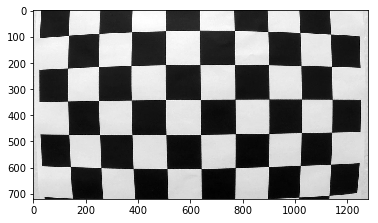

In [2]:
path = 'camera_cal/calibration1.jpg'
img = cv2.imread(path)

#cv2.imshow('chessboard', img)

# Convert to grayscale
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

print(img.shape)
print(gray.shape)
plt.imshow(gray, cmap='gray')
plt.show()

In [3]:
# we will need to convert from BGR to RGB
def bgr2rgb(bgr):
    return cv2.cvtColor(bgr, cv2.COLOR_BGR2RGB)

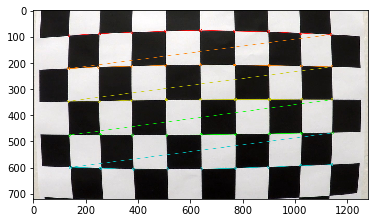

In [4]:
# Define the number of inner corners by rows and columns
nx = 9
ny = 5

# Find the corners
ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)

# If found, draw corners
if ret == True:
    img = cv2.drawChessboardCorners(img, (nx, ny), corners, ret)
    plt.imshow(bgr2rgb(img))
    plt.show()
    plt.close()

We should use at least 20 images to calibrate accurately.

In [5]:
# write a function to get calibration coeffs and camera matrix
def camera_calibration_params(images, nx, ny):
    """Get camera calibration parameters.
    
    This function uses several chessboard images and returns 
    the calibrations parameters which are camera matrix and
    calibration coefficients.
    
    Args:
        images: A list of strings defining the path of each image.
        
        nx: the number of corners along x-axis inside a chessboard.
        
        ny: the number of corners along y-axis inside a chessboard.
    """
    
    objpoints = [] # 3D points in real world space
    imgpoints = [] # 2D points in image plane

    # prepare object points like (0, 0, 0), (1, 0, 0), 
    # (2, 0, 0), ..., (7, 5, 0)
    objp = np.zeros((ny * nx, 3), np.float32)
    objp[:,:2] = np.mgrid[0:nx,0:ny].T.reshape(-1,2)
    
    ret = False
    c_mtx, dist = None, None
    for path in images:
        img = cv2.imread(path)
        # use `COLOR_RGB2GRAY` if read by `matplotlib.image.imread`
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)
        # if corners are found, add object and image points
        if ret == True:
            imgpoints.append(corners)
            objpoints.append(objp) # all object points will be the same for each imgpoints
            print('corners found for image: ' + path)
            # draw and display corners
            #img = cv2.drawChessboardCorners(img, (nx, ny), corners, ret)
            #plt.imshow(img)
            #plt.show()
            #plt.close()

    # now do the calibration, here c_mtx is the camera matrix
    # and dist are the distiortion coefficients
    # and rvecs is the rotation and the tvecs is the
    # translation vectors.
    if ret:
        ret, c_mtx, dist, rvecs, tvecs = cv2.calibrateCamera(
            objpoints, imgpoints, gray.shape[::-1], None, None)
    
    return ret, c_mtx, dist

In [6]:
import glob

In [7]:
# get calibration parameters
images = glob.glob('./camera_cal/calibration*.jpg')
ny = 9
nx = 6

ret, c_mtx, dist = camera_calibration_params(images, nx, ny)

corners found for image: ./camera_cal/calibration12.jpg
corners found for image: ./camera_cal/calibration3.jpg
corners found for image: ./camera_cal/calibration9.jpg
corners found for image: ./camera_cal/calibration13.jpg
corners found for image: ./camera_cal/calibration20.jpg
corners found for image: ./camera_cal/calibration19.jpg
corners found for image: ./camera_cal/calibration14.jpg
corners found for image: ./camera_cal/calibration16.jpg
corners found for image: ./camera_cal/calibration11.jpg
corners found for image: ./camera_cal/calibration10.jpg
corners found for image: ./camera_cal/calibration6.jpg
corners found for image: ./camera_cal/calibration15.jpg
corners found for image: ./camera_cal/calibration7.jpg
corners found for image: ./camera_cal/calibration2.jpg
corners found for image: ./camera_cal/calibration8.jpg
corners found for image: ./camera_cal/calibration18.jpg
corners found for image: ./camera_cal/calibration17.jpg


Now we have the distortion coefficients (dist) and the camera matrix (c_mtx), thus we now can create destination images (dst) by undistorting the original camera images.

Let's undistort the first chessboard image and see the result below.

In [8]:
# define a function to undistort the raw images of cameras
def undistort(raw, c_mtx, dist):
    """Undistort raw camera images.
    
    This function uses the camera matrix (c_mtx), distortion
    coefficients (dist) to undistort raw camera images.
    
    Returns BGR images!
    
    Args:
        raw (ndarray): The image taken by the cameraof which no 
            distortion correction applied. Image should be in `BGR` 
            format, read with `cv2.imread`.
            
        c_mtx: Camera calibration matrix, can be obtained using the
            `cv2.calibrateCamera` module.
        
        dist: Distortion coefficients, can be obtained using the
            `cv2.calibrateCamera` module.
    """
    
    # get undistorted destination image
    undist = cv2.undistort(raw, c_mtx, dist, None, c_mtx)
    
    return undist

Let's show an undistorted image as a result

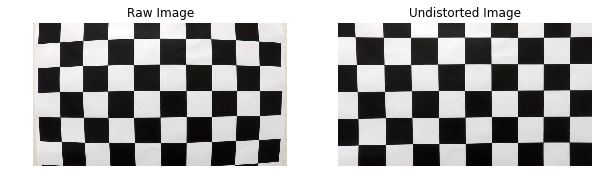

In [9]:
# we will chose and undistort one of the images:
# let's chose the first image
raw = cv2.imread('./camera_cal/calibration1.jpg')
undist = undistort(raw, c_mtx, dist)

plt.figure(figsize=(10,20))
plt.subplot(1,2,1)
plt.imshow(bgr2rgb(raw))
plt.title('Raw Image')
plt.axis('off')
plt.subplot(1,2,2)
plt.title('Undistorted Image')
plt.imshow(bgr2rgb(undist))
plt.axis('off')
plt.show()
plt.close()

The last image on the right is the result of an undistorted image after applying camera calibration.

## Perspective Transform

An image gets smaller and smaller as it goes further away from the camera, and this phenomenon is known as perspective. Thus, in 2D images, parallel lines appear to converge to a point.

For example, as in the situation of an image of the road and the lane lines, the lane gets smaller as it gets further away from the camera. 

Mathematicly we can express this phenomenon as, in real world coordinates (X,Y,Z), greater the magnitude of an object's Z-coordinate, the smaller it will appear in an image.

A perspective transform uses this expression to transform an image by warping the image and dragging the points towards or pushing away from the camera.

Perpective transform (i.e. a bird's-eye view transform) is usefull, specifically, when the intention is to find the curvature of a lane.

To summarize, a perpective transform changes the perspective to view the same scene from different viewpoints and angles.

### Perspective Transform Using OpenCV

Selecting four points on an image is enough to define a linear transformation from one perspective to another. For this purpose let's choose an image from chessboard examples and apply view transform.

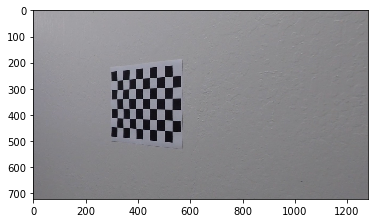

In [10]:
# first, choose an image and undistort
path = './camera_cal/calibration7.jpg'
raw = cv2.imread(path)

undist = undistort(raw, c_mtx, dist)

plt.imshow(bgr2rgb(undist))
plt.show()
plt.close()

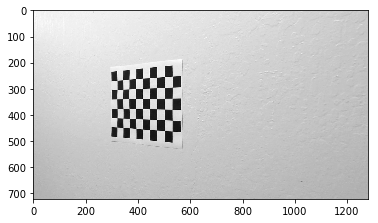

In [11]:
# convert image to single channel
gray = cv2.cvtColor(undist, cv2.COLOR_BGR2GRAY)

plt.imshow(gray, cmap='gray')
plt.show()
plt.close()

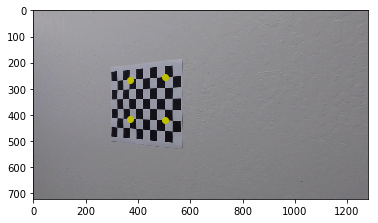

In [12]:
# let's automaticly find the points of corners and use them as referance
nx = 9
ny = 6

ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)

# if found, use 4 of the points as marking a rectangle
if ret == True:
    pt1 = corners[2, 0]
    pt2 = corners[7, 0]
    pt3 = corners[43, 0]
    pt4 = corners[38, 0]
    # source points
    src = np.float32([pt1, pt2, pt3, pt4])
    # display marked points
    plt.imshow(bgr2rgb(undist))
    plt.plot(pt1[0], pt1[1], marker='o', color='y')
    plt.plot(pt2[0], pt2[1], marker='o', color='y')
    plt.plot(pt3[0], pt3[1], marker='o', color='y')
    plt.plot(pt4[0], pt4[1], marker='o', color='y')

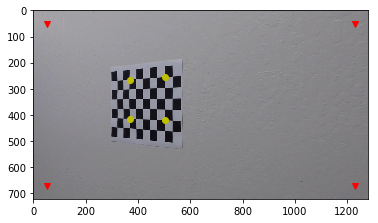

In [13]:
# now let's define destination points and change the perspective

img_size = gray.shape[::-1]

if ret == True:
    offset = 50
    pt21 = [offset, offset]
    pt22 = [img_size[0] - offset, offset]
    pt23 = [img_size[0] - offset, img_size[1] - offset]
    pt24 = [offset, img_size[1] - offset]
    dst = np.float32([pt21, pt22, pt23, pt24])
    # let's plot again
    plt.imshow(bgr2rgb(undist))
    plt.plot(pt1[0], pt1[1], marker='o', color='y')
    plt.plot(pt2[0], pt2[1], marker='o', color='y')
    plt.plot(pt3[0], pt3[1], marker='o', color='y')
    plt.plot(pt4[0], pt4[1], marker='o', color='y')
    plt.plot(pt21[0], pt21[1], marker='v', color='r')
    plt.plot(pt22[0], pt22[1], marker='v', color='r')
    plt.plot(pt23[0], pt23[1], marker='v', color='r')
    plt.plot(pt24[0], pt24[1], marker='v', color='r')
    plt.show()
    plt.close()

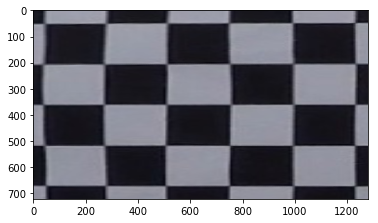

In [14]:
# now let's transform and see the result

if ret == True:
    # get transformation matrix
    M = cv2.getPerspectiveTransform(src, dst)
    # get tranformed image as named warped
    warped = cv2.warpPerspective(undist, M, img_size)
    plt.imshow(bgr2rgb(warped))
    plt.show()
    plt.close()

### Undistort Test Images 

Now we will undistort the test images, save them to `output_images` folder and show the difference below.

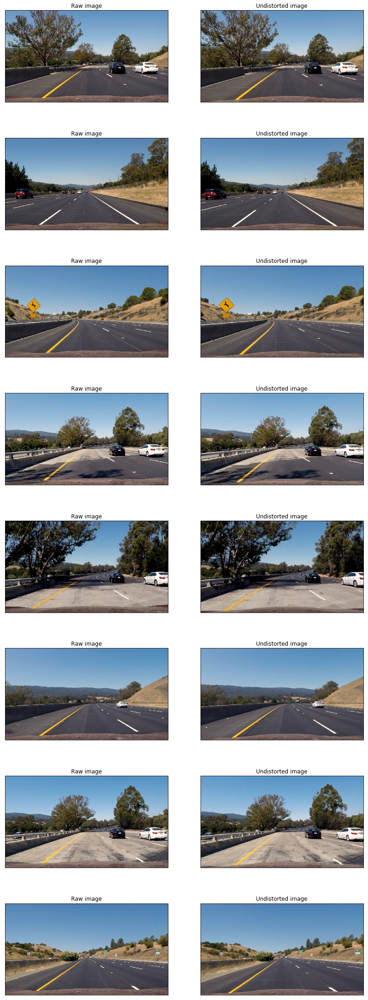

In [15]:
# get the path list of test images
test_img_paths = glob.glob('./test_images/*.jpg')

fig, axarr = plt.subplots(8, 2, figsize=(2 * 7, 8 * 5),
                             subplot_kw={'xticks': [], 'yticks': []})

undist_test_imgs = []
i = 0
for path in test_img_paths:
    # undistort each test image
    raw = cv2.imread(path)
    undist = undistort(raw, c_mtx, dist)
    undist_test_imgs.append(undist)
    # save undistorted image
    plt.imsave(
        'output_images/undistorted_' 
        + path.split('/')[-1].split('.')[0]
        + '.png', bgr2rgb(undist))
    
    axarr[i, 0].imshow(bgr2rgb(raw))
    axarr[i, 0].set_title('Raw image')
    axarr[i, 1].imshow(bgr2rgb(undist))
    axarr[i, 1].set_title('Undistorted image')
    i += 1

plt.show()
plt.close()

The images on the left are the raw images and on the right are the undistorted result of calibrating the camera.

## Gradient Thresholding

Together with Hough line transformation, the Canny edge detection technique holds importance for detecting the lane lines. And the Canny edge detection algorithm is applied by Sobel operators. Sobel operation is a way of taking the derivative in the $x$ or $y$ direction.

A 3x3 sobel operator can be applied in the $x$ or $y$ directions,

for the $x$ direction:

$$
S_x = \left(\begin{array}{ccc}
-1 & 0 & 1 \\
-2 & 0 & 2 \\
-1 & 0 & 1
\end{array}\right) ,
$$

and for $y$ direction:
$$
S_y = \left(\begin{array}{ccc}
-1 & -2 & -1 \\
0 & 0 & 0 \\
1 & 2 & 1
\end{array}\right) .
$$

These examples are Sobel operators of kernel size 3x3. A larger kernel size implies taking the gradient over a larger region of the image and results in a smoother gradient.

### A Sobel Operation Funciton with Python and OpenCV

In [16]:
def multiple_edge_detection(
    img, k_size=[3, 3, 3], orient='x',
    s_thr=(0, 255), mag_thr=(0, 255), 
    dir_thr=(0, np.pi/2)):
    """Apply Sobel operation multiple times detect edges.
    
    This function applies multiple Sobel operations: `abs_sobel_thr`,
    `mag_thr` and `dir_thr`, then using multiple thresholds detects
    the edges on an image.
    
    Args:
        img: an numpy image array, it should be read by 
            `opencv.imread` module.
        
        k_size = Three kernel sizes for three operations,
            each kernel size should be an odd number
            (integer). For example: kernel_size=[3, 5, 7]
            means, in each Sobel function, apply three 
            sobel operations with kernels 3x3, 5x5, 7x7, 
            respectively.
        
        orient: A string value, defines the orientation of Sobel 
            operation for `abs_sobel_thr` function. It can be 
            'x' or 'y'.
        
        s_thr: A tuple to define max and min values of thresholds
            for `abs_sobel_thr` function.
        
        mag_thr: A tuple to define max and min values of thresholds
            for `mag_thr` function.
        
        dir_thr: A tuple to define max and min values of thresholds
            for `dir_thr` function.
    """
    
    # convert to gray image, if `img` is read with
    # matplotlib.pyplot.imread(), please use
    # cv2.COLOR_RGB2GRAY
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    def abs_sobel_thr(gray=gray, k_size=k_size[0], orient=orient, thresh=s_thr):
        if orient is 'x':
            sobel = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=k_size)
        else:
            sobel = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=k_size)
        # take the absolute value
        sobel = np.absolute(sobel)
        # scale
        sobel = np.uint8(255 * sobel / np.max(sobel))
        # thresholding
        s_binary = np.zeros_like(sobel)
        s_binary[(sobel >= thresh[0]) & (sobel <= thresh[1])] = 1
        return s_binary
    
    def mag_thr(gray=gray, k_size=k_size[1], thresh=mag_thr):
        sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=k_size)
        sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=k_size)
        # take the absolute value
        mag = np.sqrt(sobelx**2 + sobely**2)
        # scale
        mag = np.uint8(255 * mag / np.max(mag))
        # thresholding
        mag_binary = np.zeros_like(mag)
        mag_binary[(mag >= thresh[0]) & (mag <= thresh[1])] = 1
        return mag_binary
    
    def dir_thr(gray=gray, k_size=k_size[2], thresh=dir_thr):
        sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=k_size)
        sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=k_size)
        absgraddir = np.arctan2(np.absolute(sobely), np.absolute(sobelx))
        # thresholding
        dir_binary = np.zeros_like(absgraddir)
        dir_binary[(absgraddir >= thresh[0]) & (absgraddir <= thresh[1])] = 1
        return dir_binary
    
    gradx = abs_sobel_thr(gray, orient='x')
    grady = abs_sobel_thr(gray, orient='y')
    mag_binary = mag_thr(gray)
    dir_binary = abs_sobel_thr(gray)
    
    combined = np.zeros_like(dir_binary)
    combined[((gradx == 1) & (grady == 1)) | 
             ((mag_binary == 1) & (dir_binary == 1))] = 1
    
    return combined

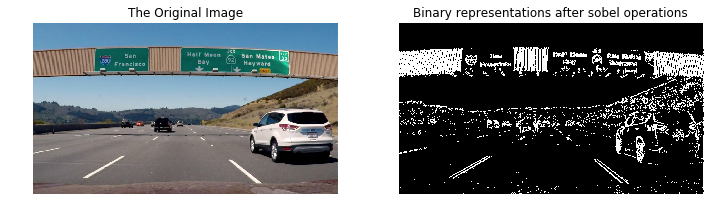

In [17]:
# test multiple edge detection

# read image
img = cv2.imread('examples/signs_vehicles_xygrad.jpg')

# get edges
edges = multiple_edge_detection(img, s_thr=(10, 250), mag_thr=(5, 250), 
                                dir_thr=(0.1, 1.2))

plt.figure(figsize=(12,24))
plt.subplot(1,2,1)
plt.imshow(bgr2rgb(img))
plt.title('The Original Image')
plt.axis('off')
plt.subplot(1,2,2)
plt.title('Binary representations after sobel operations')
plt.imshow(edges, cmap='gray')
plt.axis('off')
plt.show()
plt.close()

## Color Spaces

Converting images to gray scales, before detecting the edges, we lose valuable color information. For example, converting the road image to gray scale, especially when there is reflection on the road, yellow lane lines may disappear. To overcome this problem we should use other kind of a color space like HLS (Hue-Saturation-Lightness). Here in the HLS space, the lightness is the value that varies the most in different lighting conditions. And H and S channels are more consistent under shadow or brightness. Thus, using only the H and S channels in HLS space and discarding the L, we can detect different colors of lane lines more reliably.

### Exploration on Different Color Channels

The system we build should be robust to both shadow effects and reflections. Thus we will investigate various challenging images which have strong reflection or shadows.

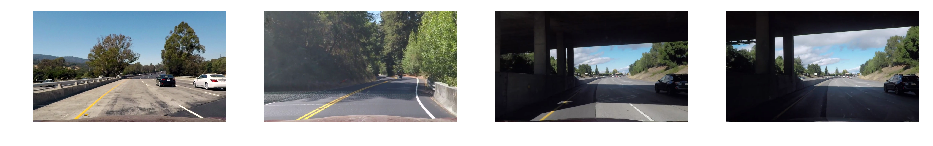

In [18]:
# read the images and undistort

# img0 is a standart test image
# img1 is a road view with reflection.
# img2 is a road view with shadows
# img3 and img4 are road views with extreme shadow conditions.
img0 = cv2.imread('examples/straight_lines1.jpg')
img1 = cv2.imread('examples/snap01.png')
img2 = cv2.imread('examples/snap02.png')
img3 = cv2.imread('examples/snap03.png')
img4 = cv2.imread('examples/snap04.png')

img0 = undistort(img0, c_mtx, dist)
img1 = undistort(img1, c_mtx, dist)
img2 = undistort(img2, c_mtx, dist)
img3 = undistort(img3, c_mtx, dist)
img4 = undistort(img4, c_mtx, dist)

plt.imsave('examples/undist_straight_lines1.jpg', bgr2rgb(img0))
plt.imsave('examples/undist_snap01.png', bgr2rgb(img1))
plt.imsave('examples/undist_snap02.png', bgr2rgb(img2))
plt.imsave('examples/undist_snap03.png', bgr2rgb(img3))
plt.imsave('examples/undist_snap04.png', bgr2rgb(img4))

undist_hard_imgs = [img0, img1, img2, img3, img4]

plt.figure(figsize=(20,5))
for i, img in enumerate(undist_hard_imgs):
    if i != 0:
        plt.subplot(1,5,i+1)
        plt.imshow(bgr2rgb(img))
        plt.axis('off')
plt.show()
plt.close()

In [19]:
# define a color thresholding function
def color_thresholding(
    img, ch_type='rgb', 
    binary=True, plot=False, 
    thr=(220, 255), save_path=None):
    """Apply color thresholding.
    
    Arg:
        img (numpy array): numpy image array, should be in `RGB`
            color space, NOT in `BGR`.
            
        ch_type (str): can be 'rgb', 'hls', 'hsv', 'yuv', 'ycrcb',
            'lab', 'luv'.
            
        binary (bool): If `True` then show and returns binary
            images. If not, returns original images in defined 
            color spaces.
            
        plot: If `True`, shows images.
        
        thr: min, max value for threasholding.
        
        save_path: if defines, saves figures.
    """
    # get channels
    if ch_type is 'hls':
        img = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    elif ch_type is 'hsv':
        img = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
    elif ch_type is 'yuv':    
        img = cv2.cvtColor(img, cv2.COLOR_RGB2YUV)
    elif ch_type is 'ycrcb':
        img = cv2.cvtColor(img, cv2.COLOR_RGB2YCrCb)
    elif ch_type is 'lab':
        img = cv2.cvtColor(img, cv2.COLOR_RGB2Lab)
    elif ch_type is 'luv':
        img = cv2.cvtColor(img, cv2.COLOR_RGB2Luv)
    
    img_ch1 = img[:,:,0]
    img_ch2 = img[:,:,1]
    img_ch3 = img[:,:,2]

    # apply thresholding
    bin_ch1 = np.zeros_like(img_ch1)
    bin_ch2 = np.zeros_like(img_ch2)
    bin_ch3 = np.zeros_like(img_ch3)

    bin_ch1[(img_ch1 > thr[0]) & (img_ch1 <= thr[1])] = 1
    bin_ch2[(img_ch2 > thr[0]) & (img_ch2 <= thr[1])] = 1
    bin_ch3[(img_ch3 > thr[0]) & (img_ch3 <= thr[1])] = 1
    
    if binary:
        imrep_ch1 = bin_ch1
        imrep_ch2 = bin_ch2
        imrep_ch3 = bin_ch3
    else:
        imrep_ch1 = img_ch1
        imrep_ch2 = img_ch2
        imrep_ch3 = img_ch3
    if plot:
        n_rows = 2
        n_cols = 3
        fig, axarr = plt.subplots(
            n_rows, n_cols,
            figsize=(n_cols * 5, n_rows * 3),
            subplot_kw={'xticks': [], 'yticks': []})
        axarr[0, 0].imshow(img_ch1, cmap='gray')
        axarr[0, 0].set_title('original ' + ch_type + ' space: ch1')
        axarr[0, 1].imshow(img_ch2, cmap='gray')
        axarr[0, 1].set_title('original ' + ch_type + ' space: ch2')
        axarr[0, 2].imshow(img_ch3, cmap='gray')
        axarr[0, 2].set_title('original ' + ch_type + ' space: ch3')
        
        axarr[1, 0].imshow(imrep_ch1, cmap='gray')
        axarr[1, 0].set_title('binary ' + ch_type + ' space: ch1')
        axarr[1, 1].imshow(imrep_ch2, cmap='gray')
        axarr[1, 1].set_title('binary ' + ch_type + ' space: ch2')
        axarr[1, 2].imshow(imrep_ch3, cmap='gray')
        axarr[1, 2].set_title('binary ' + ch_type + ' space: ch3')
        plt.show()
        plt.close()
    
    if save_path is not None:
        if not os.path.exists(save_path):
            os.makedirs(save_path)
        plt.imsave(save_path + '/' + ch_type + '_ch1.png', imrep_ch1, cmap='gray')
        plt.imsave(save_path + '/' + ch_type + '_ch2.png', imrep_ch2, cmap='gray')
        plt.imsave(save_path + '/' + ch_type + '_ch3.png', imrep_ch3, cmap='gray')
    
    return imrep_ch1, imrep_ch2, imrep_ch3

In [20]:
# define a function to compare two different images
def compare_2img_color_thr(img1, img2, binary=False, save_path=[None, None]):
    """Compares two images for various color thresholdings.
     
    Args:
        img1 (numpy array): numpy image array, should be in `RGB` color
            space, NOT in `BGR`.
        
        img2 (numpy array): numpy image array, should be in `RGB` color
            space, NOT in `BGR`.
        
        binary (bool): If `True`, returns binary representations.
            If `False`, returns original images in defined
            color spaces.
        
        save_path (str): if not None, figures are saved.
    """
    
    ch_types = ['rgb', 'hls', 'hsv', 'yuv', 'ycrcb', 'lab', 'luv']
    
    dst_images = {}
    dst_images['img1'] = {}
    dst_images['img2'] = {}
    for ch_type in ch_types:
        dst_images['img1'][ch_type] =\
            color_thresholding(img1, ch_type=ch_type, binary=binary, save_path=save_path[0])
        dst_images['img2'][ch_type] =\
            color_thresholding(img2, ch_type=ch_type, binary=binary, save_path=save_path[1])
        
    n_cols = 3 * 2
    n_rows = len(ch_types)
    
    fig, axarr = plt.subplots(
        n_rows, n_cols, figsize=(n_cols * 2.5, n_rows * 2),
        subplot_kw={'xticks': [], 'yticks': []})
    
    k = 0
    for ch_type in ch_types:
        axarr[k, 0].imshow(dst_images['img1'][ch_type][0], cmap='gray')
        axarr[k, 0].set_title(ch_type + ' space: ch1')
        
        axarr[k, 1].imshow(dst_images['img1'][ch_type][1], cmap='gray')
        axarr[k, 1].set_title(ch_type + ' space: ch2')
        
        axarr[k, 2].imshow(dst_images['img1'][ch_type][2], cmap='gray')
        axarr[k, 2].set_title(ch_type + ' space: ch3')
        
        axarr[k, 3].imshow(dst_images['img2'][ch_type][0], cmap='gray')
        axarr[k, 3].set_title(ch_type + ' space: ch1')
        
        axarr[k, 4].imshow(dst_images['img2'][ch_type][1], cmap='gray')
        axarr[k, 4].set_title(ch_type + ' space: ch2')
        
        axarr[k, 5].imshow(dst_images['img2'][ch_type][2], cmap='gray')
        axarr[k, 5].set_title(ch_type + ' space: ch3')
        
        k += 1

    plt.show()
    plt.close()

#### Reflection and Shadow Conditions

The representations in different color spaces for two images with reflections and shadows, respectively.

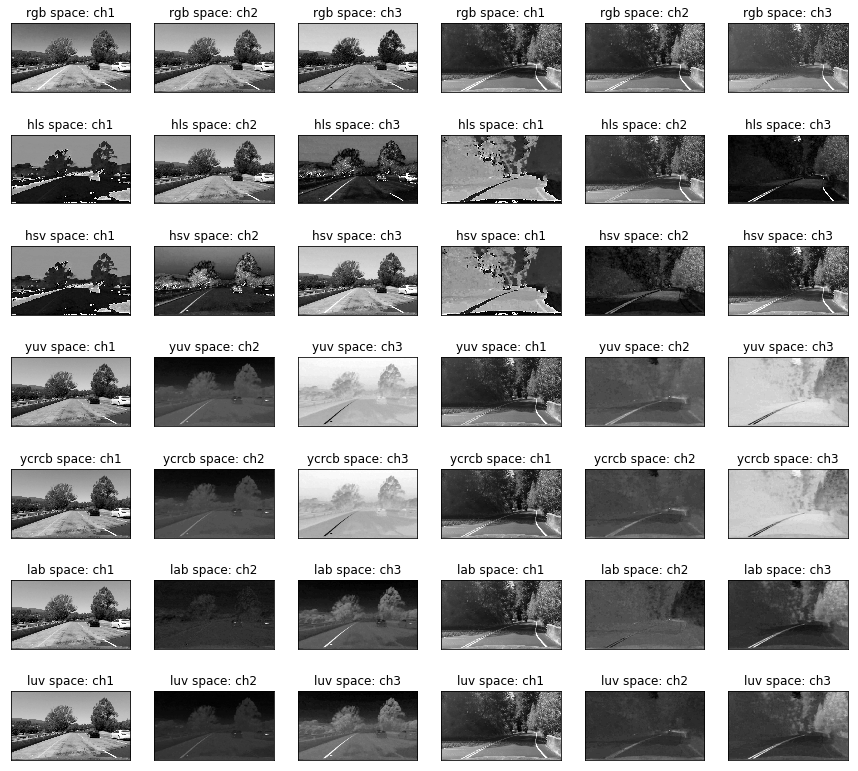

In [21]:
compare_2img_color_thr(
    bgr2rgb(img1), bgr2rgb(img2), 
    binary=False, save_path=[None, './examples/channel_thr/snap02'])

The first three columns are three different channel (ch1, ch2, ch3) representations for the first image, and the last three columns are again three channel representations for the second image.

As we can see from the results, some channels preserves and better represent the pixels of the colored (yellow) lane in both conditions of reflection and the shadow. For example, pixel information is well preserved in channel-3 (ch3) of Luv color space.

In addition, the information of white lane pixels are preserved and tractable in some of the channels (e.g. ch3 in RGB, ch2 in HVS) but, however, not so distinguisted as in the case of yellow lane pixels. Thus, applying a sobel operation for the white lanes could be usefull as we will discuss later.

#### Severe Shadow Conditions

Let's investigate the information we get from different color spaces in severe shadow conditons.

The two image below are from the same video clip captured on different times. 

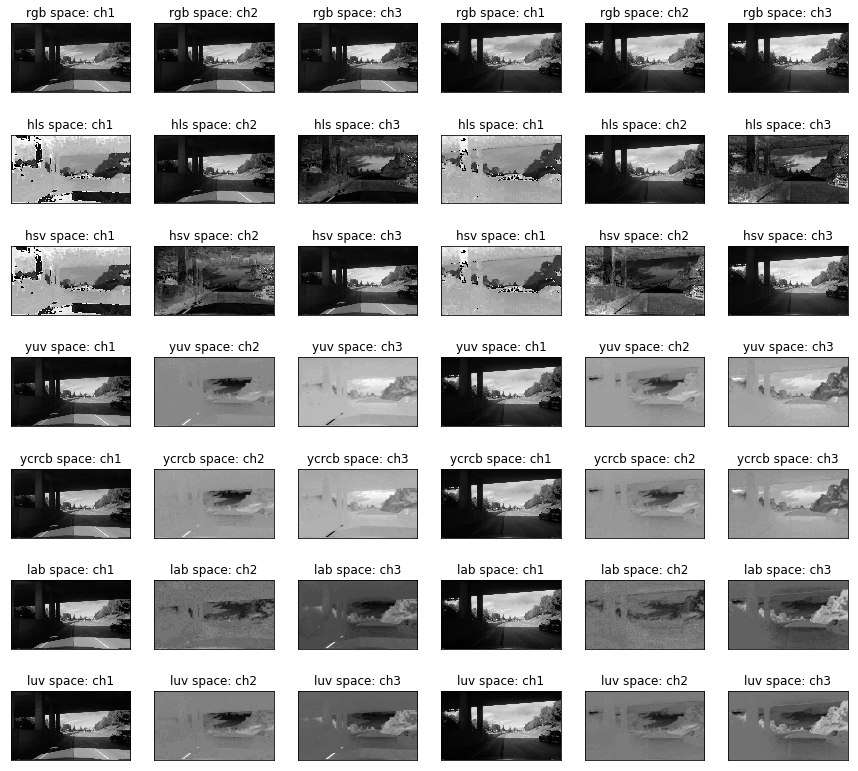

In [22]:
compare_2img_color_thr(
    bgr2rgb(img3),
    bgr2rgb(img4),
    binary=False,
    save_path=[
        './examples/channel_thr/snap03', 
        './examples/channel_thr/snap04'
        ]
    )

Some color spaces (e.g. HSV, LUV, YUV)  represent colored objects from lighting conditions independently. And this is useful when the intention is to detect colored lane lines. With extreme shadow conditions however, the information from a colored (yellow in this case) lane is lost. The reason is the color of an object changes due to reflecting light from other objects [(Ying et al., 2017)](https://arxiv.org/abs/1708.00975). In our case, for example, the yellow lane lines have no blue color but when it is in an extreme shadow, as it is under the shadow of the bridge here, it changes color and contains blue color. As a result, any of the color spaces above, do not contain a well represented and distinguished lane pixels from the environment as it was in the previous examples, and thus, a simple color thresholing will not work for extreme shadow conditions.

#### The Road View in Bird's-eye Viewpoint

We will transform the current viewpoint to bird's-eye view to detect and measure the lane curvatures accurately.

In [19]:
# write a masking function for defining a region of interest
def region_of_interest(img, points):
    """Mask the region of interest
    
    Only keeps the region of the image defined by the polygon
    formed from `points`. The rest of the image is set to black.
    
    Args:
        img: numpy array representing the image.
        points: verticies, example:
            [[(x1, y1), (x2, y2), (x4, y4), (x3, y3)]]
    """
    # define empty binary mask
    mask = np.zeros_like(img)
    
    # define a mask color to ignore the masking area
    # if there are more than one color channels consider
    # the shape of ignoring mask color
    if len(img.shape) > 2:
        n_chs = img.shape[2]
        ignore_mask_color = (255,) * n_chs
    else:
        ignore_mask_color = 255
    
    # define unmasking region 
    cv2.fillPoly(mask, points, ignore_mask_color)
    
    # mask the image
    masked_img = cv2.bitwise_and(img, mask)
    
    return masked_img

# define a perspective transformation function
def birds_eye_transform(img, points, offsetx):
    """Transforms the viewpoint to a bird's-eye view.
    
    Applies a perspective transformation. Returns
    the inverse matrix and the warped destination
    image.
    
    Args:
        img: A numpy image array.
        points: A list of four points to be flattened.
            Example: points = [[x1,y1], [x2,y2], [x4,y4], [x3,y3]].
        offsetx: offset value for x-axis.
    """
    
    img_size = img[:,:,0].shape[::-1]
    
    
    # get the region of interest
    img = region_of_interest(img, np.array([points]))
    
    src = np.float32(
        [
            points[0],
            points[1],
            points[2],
            points[3],
        ])

    pt1 = [offsetx, 0]
    pt2 = [img_size[0] - offsetx, 0]
    pt3 = [img_size[0] - offsetx, img_size[1]]
    pt4 = [offsetx, img_size[1]]
    dst = np.float32([pt1, pt2, pt3, pt4])
    
    mtx = cv2.getPerspectiveTransform(src, dst)
    invmtx = cv2.getPerspectiveTransform(dst, src)
    
    warped = cv2.warpPerspective(img, mtx, img_size)
    
    return invmtx, warped

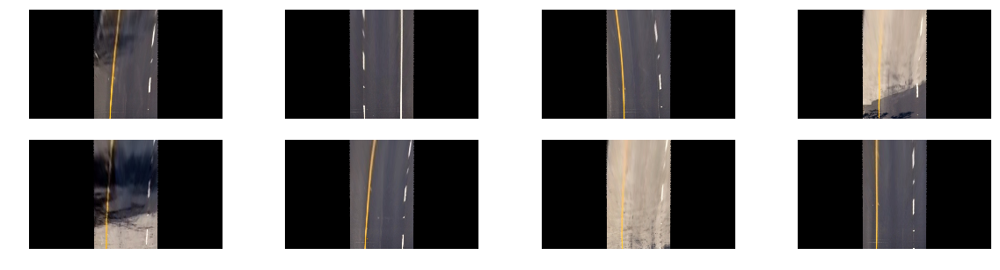

In [20]:
points = np.array([
    [545, 457],
    [735, 457],
    [1280, 670],
    [0, 670],
])

warped_test_imgs = []
warped_test_invmtxs = []
for img in undist_test_imgs:
    invmtx, warped = birds_eye_transform(img, points, offsetx=430)
    warped_test_imgs.append(warped)
    warped_test_invmtxs.append(invmtx)

plt.figure(figsize=(20,5))
for i, warped in enumerate(warped_test_imgs):
    plt.subplot(2,4,i+1)
    plt.imshow(bgr2rgb(warped))
    plt.axis('off')
plt.show()
plt.close()

#### Exploration on Lane Detection with Combined Color Thresholding

We will now investigate how combined color thresholing results.

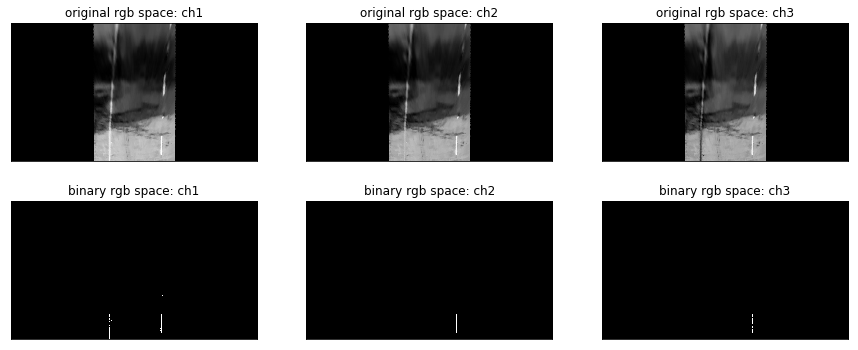

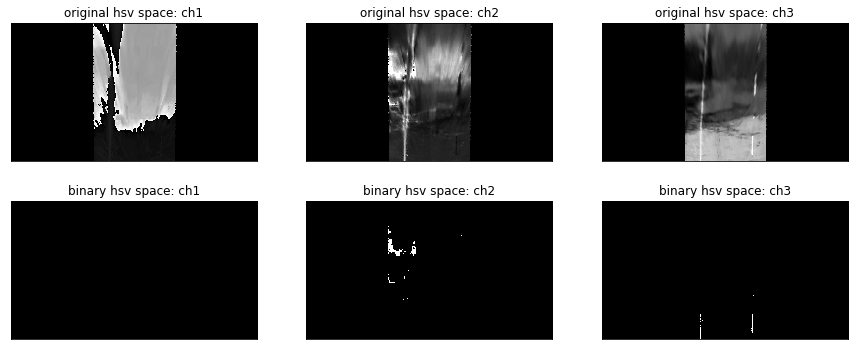

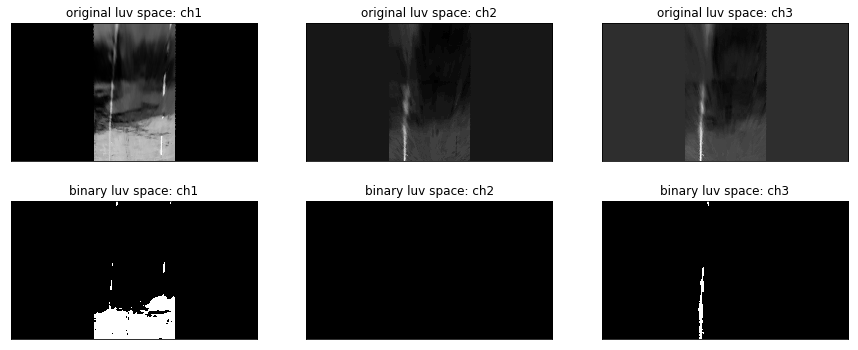

In [25]:
# Combine some of the channels and see the result
bin_rgb_ch1, bin_rgb_ch2, bin_rgb_ch3 =\
    color_thresholding(bgr2rgb(warped_test_imgs[4]), ch_type='rgb', thr=(230, 255), plot=True)
bin_hsv_ch1, bin_hsv_ch2, bin_hsv_ch3 =\
    color_thresholding(bgr2rgb(warped_test_imgs[4]), ch_type='hsv', thr=(230, 255), plot=True)
bin_luv_ch1, bin_luv_ch2, bin_luv_ch3 =\
    color_thresholding(bgr2rgb(warped_test_imgs[4]), ch_type='luv', thr=(157, 255), plot=True)

Let's define a function for a combined result with the channels above.

In [21]:
# Define a function to combine color thresholding
def combined_color_thresholding(
    img, thr_rgb=(230,255), thr_hsv=(230,255), thr_luv=(157,255)):
    """Combines color thresholding on different channels
    
    Returns a binary image.
    
    Args:
        img: Numpy image array, should be in `RGB` color
            space.
        
        thr_rgb: min and max thresholding values for RGB color
            space.
        
        thr_hsv: min and max thresholding values for HSV color
            space.
        
        thr_luv: min and max thresholding values for LUV color
            space.
    """
    
    bin_rgb_ch1, bin_rgb_ch2, bin_rgb_ch3 =\
        color_thresholding(img, ch_type='rgb', thr=thr_rgb)
        
    bin_hsv_ch1, bin_hsv_ch2, bin_hsv_ch3 =\
    color_thresholding(img, ch_type='hsv', thr=thr_hsv)
    
    bin_luv_ch1, bin_luv_ch2, bin_luv_ch3 =\
    color_thresholding(img, ch_type='luv', thr=thr_luv)
    
    binary = np.zeros_like(bin_rgb_ch1)
    binary[
        (bin_rgb_ch1 == 1)
        | (bin_hsv_ch3 == 1)
        | (bin_luv_ch3 == 1)
        ] = 1
    
    return binary

Combined thresholding results for each test images

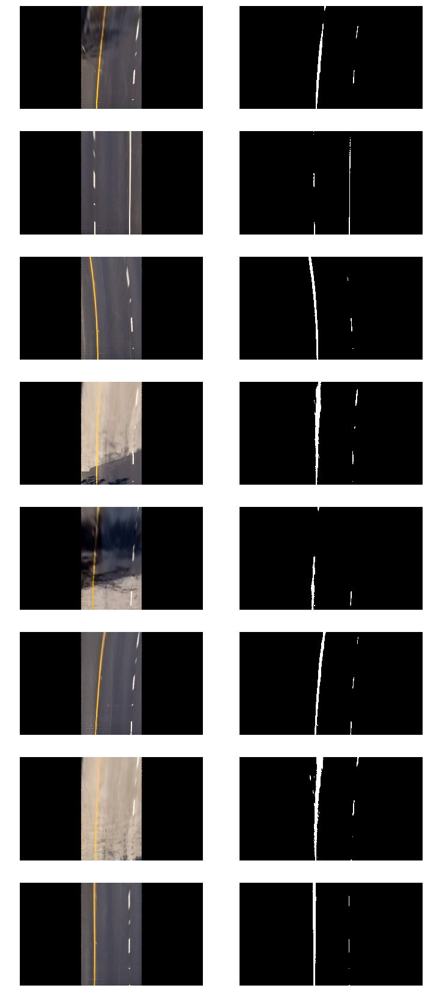

In [27]:
plt.figure(figsize=(12,30))
i = 1
for img in warped_test_imgs:
    n_fig = len(undist_test_imgs)
    binary = combined_color_thresholding(bgr2rgb(img))
    plt.subplot(n_fig, 2, i)
    plt.imshow(bgr2rgb(img))
    plt.axis('off')
    plt.subplot(n_fig, 2, i+1)
    plt.imshow(binary, cmap='gray')
    plt.axis('off')
    i += 2

## Lane Search Algorithm

Here we will define a lane searh function to use the binary representation of the top-view image of the road and look for the white pixel clusters to determine if it is a lane or noise.

Here the improtant quantites are the number of minimum white pixels in a cluster (as default min_samp=50) and the magnitude of the standard deviation of the histogram of white pixels along the x-axis. If the standard deviation is high, it is a noise rather than a lane line.

In [22]:
def search_lane(warped, n_stepsy=9, n_stepsx=2, std_max=5., min_samp=50):
    """Search binary images to detect lane lines.
    
    Takes the top-view (warped) image as input, applies color
    thresholding to get a binary representation. Searches binary 
    image with sliding windows and detects lane pixels. In the 
    sliding window, if the standart deviation value for the white 
    pixels is lower than a threshold, detects as line pixels and 
    appends to result.
    
    returns an output image and the fitting parameters.
    
    Args:
        warped (ndarray): numpy array representing the top-view road image.
            Image should be in RGB format.
        
        n_stepsy (int): number of slides on y-axis.
        
        n_stepsx (int): number of slides on x-axis (n_stepsx >= 2).
        
        std_max (float): Float to represent the maximum value of
            standart deviation.
        
        min_samp (int): minimum number of white pixels to considering
            to check if lane or not.
    """
    
    def stdx(binary_window, starty=0, startx=0):
        """Computes mean and standart deviation of a binary window.
    
        Computes and returns the standart deviation value of lane pixels
        in the binary search window, along x-axis. Also returns number of 
        samples (number of white pixels in this case) and the lists of the
        absolute position of white pixels (absolute x and y coordinates of 
        lane pixels) in the whole binary image.
        
        Args:
            binary_window: An numpy array to represent a small,
                rectangular portion of an image as a sliding 
                search window/kernel.
                
            startx: integer to represent window position start
                value on x-axis.
                
            starty: integer to represent window position start
                value on y-axis.
        
        """
        y, x = binary_window.nonzero()
        # get absolute coordinates in whole image
        y_absolute = y + starty
        x_absolute = x + startx
        n_samples = len(x) # number of samples
        x = x + 1
        if n_samples > 0:
            std = x.std()
        else:
            std = np.inf
        return n_samples, std, x_absolute.tolist(), y_absolute.tolist()
    
    if n_stepsx < 2:
        n_stepsx = 2
    offsety = warped.shape[0] // n_stepsy
    offsetx = warped.shape[1] // n_stepsx
    halfx = warped.shape[1] // 2
    
    margin = 50 # margin of detected cluster squares (just to draw a rectangle).
    
    # define output images for visualization
    out_img = np.zeros_like(warped)
    
    # list left and right lane indices
    left_lane_inds = [[],[]]
    right_lane_inds = [[],[]]
    
    # thresholds for combined color channels
    thr_hsv = (230,255)
    thr_luv = (157,255)
    thr_rgb_list = [
        (230, 255),
        (185, 230)
    ]
    # get binary images list
    binary_images = []
    for thr_rgb in thr_rgb_list:
        binary = combined_color_thresholding(
            warped, thr_rgb=thr_rgb, thr_hsv=thr_hsv, thr_luv=thr_luv)
        binary_images.append(binary)
    
    for i in range(n_stepsy):
        starty = i * offsety
        endy = (i+1) * offsety
        
        left_res, right_res = False, False
        for binary in binary_images:
            
            for j in range(n_stepsx):
                
                startx = j * offsetx
                endx = (j+1) * offsetx
                
                window = binary[starty:endy,startx:endx]
                
                n_samples, std, x, y = stdx(window, starty, startx)
                
                if startx < halfx:
                    found_flag = left_res
                else:
                    found_flag = right_res
                
                if (std < std_max) & (n_samples > min_samp) & (not found_flag):
                    histogram = np.sum(window, axis=0)
                    peak_base = np.argmax(histogram) + startx
                    winx_start = peak_base - margin
                    winx_end = peak_base + margin
                    # append x and y coors for detected lane pixels
                    # decide if left or right lane pixels
                    if peak_base < halfx:
                        left_res = True
                        left_lane_inds[0].extend(x)
                        left_lane_inds[1].extend(y)
                        color = (255,0,0)
                    else:
                        right_res = True
                        right_lane_inds[0].extend(x)
                        right_lane_inds[1].extend(y)
                        color = (0,0,255)
                    # draw output image
                    out_img[y,x,:] = 255
                    cv2.rectangle(
                        out_img,
                        (winx_start,starty),
                        (winx_end,endy),
                        color, 2)
            if left_res & right_res:
                break
    
    return out_img, left_lane_inds, right_lane_inds

Using `search_lane` function, we get the coordinates for each pixel of lane lines.

Now we will define a function to fit curved lines on this lane lines and do the measurements of curvature radius and the position of the vehicle.

In [23]:
# define a function for fitting and measurements
def fit_lane(lane_img, left_lane_inds, right_lane_inds):
    """Fit lane lines and do the measurements."""
    
    res = False
    marked_lane_img = None
    filled_lane_img = None
    fit_lane_img = None
    avg_curve_radi = None
    if (len(left_lane_inds[0]) > 0) & (len(left_lane_inds[1]) > 0)\
        & (len(right_lane_inds[0]) > 0) & (len(right_lane_inds[1]) > 0):
        
        res = True
        # fit
        # 2 degree polynomial
        left_lane_inds = np.array(left_lane_inds)
        right_lane_inds = np.array(right_lane_inds)
        # we will fit y, rather than x just because most x values may
        # be the same for different y values (f(y)=Ay^2+By+C).
        left_fit = np.polyfit(left_lane_inds[1], left_lane_inds[0], 2)
        right_fit = np.polyfit(right_lane_inds[1], right_lane_inds[0], 2)
    
        # generate x and y values for plotting
        ploty = np.linspace(0, lane_img.shape[0]-1, lane_img.shape[0])
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
        
        # mark and fill detected lanes
        # mark first
        zeros_img = np.zeros_like(lane_img[:,:,0]).astype(np.uint8)
        marked_lane_img = np.dstack((zeros_img, zeros_img, zeros_img))
        # Generate a polygon to illustrate the search window area
        # And recast the x and y points into usable format for cv2.fillPoly()
        mark_margin = 10
        left_line_window1 =\
            np.array([np.transpose(np.vstack([left_fitx-mark_margin, ploty]))])
        left_line_window2 =\
            np.array([np.flipud(np.transpose(np.vstack([left_fitx+mark_margin, ploty])))])
        left_line_pts = np.hstack((left_line_window1, left_line_window2))
        right_line_window1 =\
            np.array([np.transpose(np.vstack([right_fitx-mark_margin, ploty]))])
        right_line_window2 =\
            np.array([np.flipud(np.transpose(np.vstack([right_fitx+mark_margin, ploty])))])
        right_line_pts = np.hstack((right_line_window1, right_line_window2))
        # Draw the lane onto the warped blank image
        cv2.fillPoly(marked_lane_img, np.int_([left_line_pts]), (0,255, 0))
        cv2.fillPoly(marked_lane_img, np.int_([right_line_pts]), (0,255, 0))
        marked_lane_img = cv2.addWeighted(lane_img, 1, marked_lane_img, 0.4, 0)
        
        # mark and fill
        filled_lane_img = np.dstack((zeros_img, zeros_img, zeros_img))
        # recast x and y to usable format
        pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
        pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
        pts = np.hstack((pts_left, pts_right))
        # Draw the lane onto the warped blank image
        cv2.fillPoly(filled_lane_img, np.int_([pts]), (208, 255, 64))
    
        # measure the radious of the curvature
        # choose the max y value
        y_eval = np.max(ploty)
        # To apply pixel to meter conversion we will consider
        # lane is about 3.7 meters wide and 30 meters long.
        ym_per_pix = 30/720 # meters per pixel in y dimension
        xm_per_pix = 3.7/200 # meters per pixel in x dimension
        left_fit_cr = np.polyfit(
            left_lane_inds[1]*ym_per_pix, left_lane_inds[0]*xm_per_pix, 2)
        right_fit_cr = np.polyfit(
            right_lane_inds[1]*ym_per_pix, right_lane_inds[0]*xm_per_pix, 2)
        left_curverad = (
            (1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5)\
            / np.absolute(2*left_fit_cr[0])
        right_curverad = (
            (1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5)\
            / np.absolute(2*right_fit_cr[0])
        avg_curve_radi = (left_curverad+right_curverad)*0.5 # in meters
        
        # measure the position of the vehicle
        
    
    return res, marked_lane_img, filled_lane_img, avg_curve_radi

In [24]:
# A helper function to combine resulting images and add text
def combine_output(output_images, measurements):
    """Combine output images and write measurements."""
    
    combined_img = None
    if not None in output_images:
        # crop top views
        cropped_birds = bgr2rgb(output_images[0])[:,400:880]
        cropped_birds2 = bgr2rgb(output_images[2])[:,400:880]
        # concat 2 top view images and resize
        combined_birds = np.concatenate((cropped_birds2, cropped_birds), axis=1)
        combined_birds = cv2.resize(combined_birds, (combined_birds.shape[1]//2, combined_birds.shape[0]//2))
        # combine all 3 images
        combined_img = np.copy(bgr2rgb(output_images[4]))
        combined_img[0:360,800:1280] = combined_birds
        # add text
        fontface = cv2.FONT_HERSHEY_SIMPLEX
        fontscale = 1
        thickness = 2
        text = 'Predicted Lines'
        cv2.putText(combined_img, text, (807, 30), fontface, fontscale, (64,255,208), thickness)
        text = 'Top View'
        cv2.putText(combined_img, text, (1100, 30), fontface, fontscale, (64,255,208), thickness)
        text = 'Curve Radius = ' + '%.2f' % measurements[0] + 'm'
        cv2.putText(combined_img, text, (10, 30), fontface, fontscale, (64,255,208), thickness)
    
    return combined_img

### The Pipeline: Lane Detector

Here, using the previous functions, we will define a step by step lane detection pipeline with a function named `lane_detector`. The input to this function will be the image from an uncalibrated camera and the calibration parameters.

The pipleline steps are:
* Takes an image of road as the input.
* Undistort the image with camera calibration.
* Transforms the region of interest into bird's-eye view,
    gets a top-view of the road.
* Applies color thresholding to get a binary representation
    of lane lines.
* Detects the lane line pixels and fits a second order polynomial 
    to those pixel coordinates.
* Measures the curvature radius of the lane and the position of
    the car in the lane.
* Colors the lane, transforms back to it's previous viewpoint
    resulting the desired final image.

In [25]:
def lane_detector(image, c_mtx, dist, std_max=15., min_samp=30):
    """Detect the lane and do the measurements.
    
    Steps:
    * Takes an image of road as the input.
    * Undistort the image with camera calibration.
    * Transforms the region of interest into bird's-eye view,
        gets a top-view of the road. Also returns this image.
    * Applies color thresholding to get a binary representation
        of lane lines.
    * Detects the lane pixels and fits a second order polynomial 
        to those pixel coordinates. Returns the output image.
    * Measures the curvature radius of the lane and the position of
        the car in the lane and returns the results.
    * Colors the lane, transforms back to it's previous viewpoint
        and returns the final output image.
    
    Args:
        image: original road image in BGR colors, read with
            `cv2.imread`.
        
        c_mtx: Camera matrix for camera calibration.
        
        dist: Distortion coefficients for camera calibration.
        
        std_max: Float to represent maximum standard deviation of
            white pixel clusters to consider if they are lane pixels
            or not.
        
        min_samp: Integer to represent minimum number of white pixels
            required to consider if they are lane line pixels or not.
    """
    
    output_images = []
    measurements = []
    
    # undistort the raw image with camera calibration
    undist = undistort(image, c_mtx, dist)
    
    # source points for the top-view transformation
    points = np.array([
        [545, 457],
        [735, 457],
        [1280, 720],
        [0, 720],
        ])
    
    # get top-view image (warped) and the inverse matrix (invmtx)
    invmtx, warped = birds_eye_transform(undist, points, offsetx=430)
    
    # search lane pixels
    lane_lines, left_lane_inds, right_lane_inds =\
        search_lane(bgr2rgb(warped), n_stepsy=9, n_stepsx=2, std_max=std_max, min_samp=min_samp)
    
    # fit
    res, marked_lane_img, filled_lane_img, curve_radi =\
        fit_lane(lane_lines, left_lane_inds, right_lane_inds)
    
    # unwrap, get back to prev viewpoint and output the final image.
    img_size = image[:,:,0].shape[::-1]
    if res:
        unwarped = cv2.warpPerspective(filled_lane_img, invmtx, img_size)
        result_img = cv2.addWeighted(undist, 1, unwarped, 0.5, 0)
    else:
        result_img = undist
    
    output_images.append(warped)
    output_images.append(lane_lines)
    output_images.append(marked_lane_img)
    output_images.append(filled_lane_img)
    output_images.append(result_img)
    measurements.append(curve_radi)
    
    return output_images, measurements

## Results

Here we will investigate the lane detection algorithm on test images and see how accurately it detects the lanes, how well it fits to lane curves and how the output images with the lanes are marked look like.

As a final step we will also see the performance of the pipeline on the test video.

In [26]:
# path list of test images
test_images = glob.glob('./test_images/*.jpg')

results = []
for i, path in enumerate(test_images):
    raw = cv2.imread(path)
    out_imgs, measurements = lane_detector(raw, c_mtx=c_mtx, dist=dist)
    results.append({})
    results[i]['output_imgs'] = out_imgs
    results[i]['measurements'] = measurements

### Detected Lane Lines from Bird's-eye Viewpoint

Original road images are shown in the first column and the resulting detected lanes are shown in the second column. The detected lane pixel clusters marked with red and blue rectangles and the curvatures plotted with yellow lines.

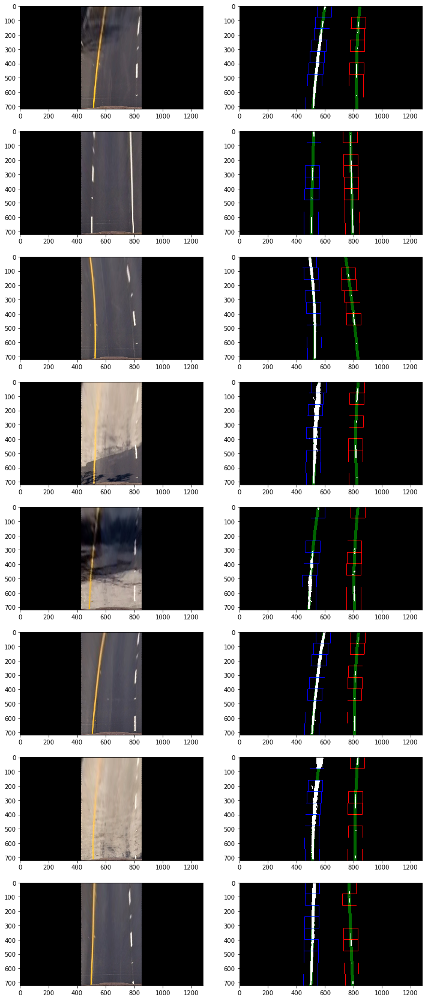

In [29]:
i = 1
plt.figure(figsize=(12,30))
for result in results:
    plt.subplot(len(results),2,i)
    plt.imshow(bgr2rgb(result['output_imgs'][0]))
    plt.subplot(len(results),2,i+1)
    plt.imshow(bgr2rgb(result['output_imgs'][2]), cmap='gray')
    i += 2
plt.show()
plt.close()

### The Final Results from The Original Viewpoint 

As a final step, the lanes are detected colored and the viewpoint transformed back to its original position. The detected lane area is shown with a colored rectangles in each sample.

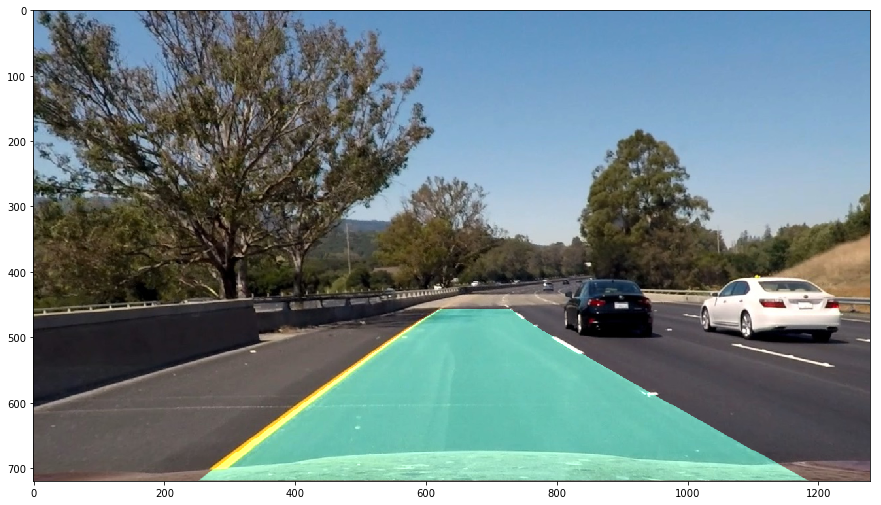

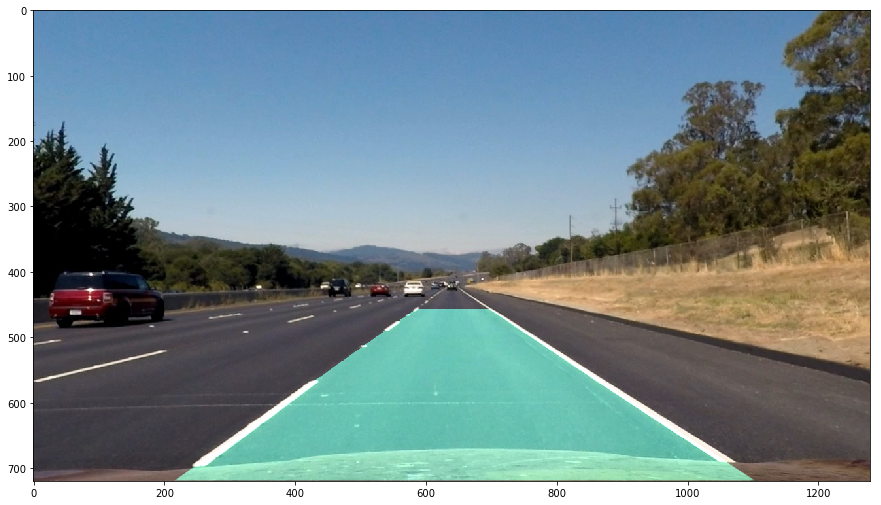

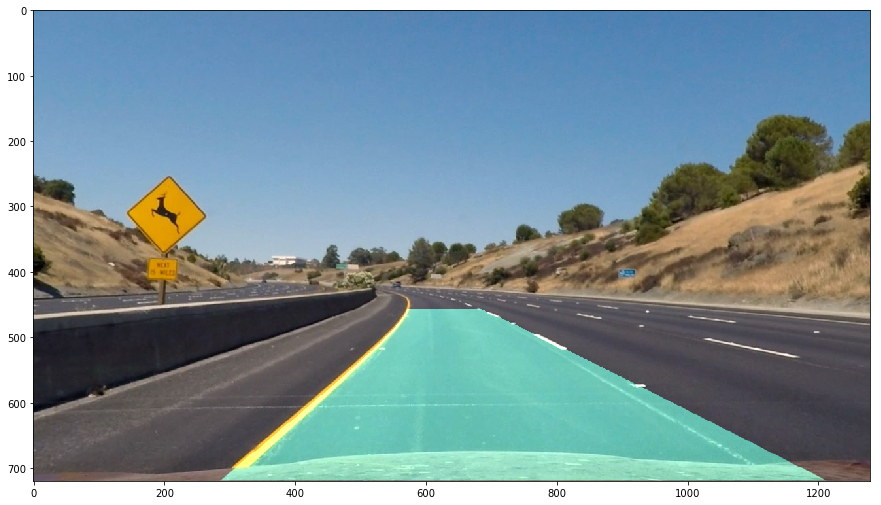

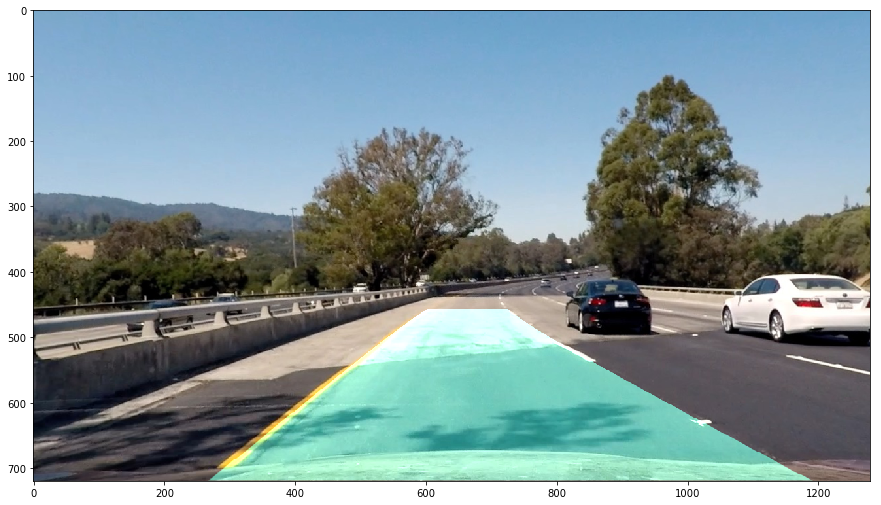

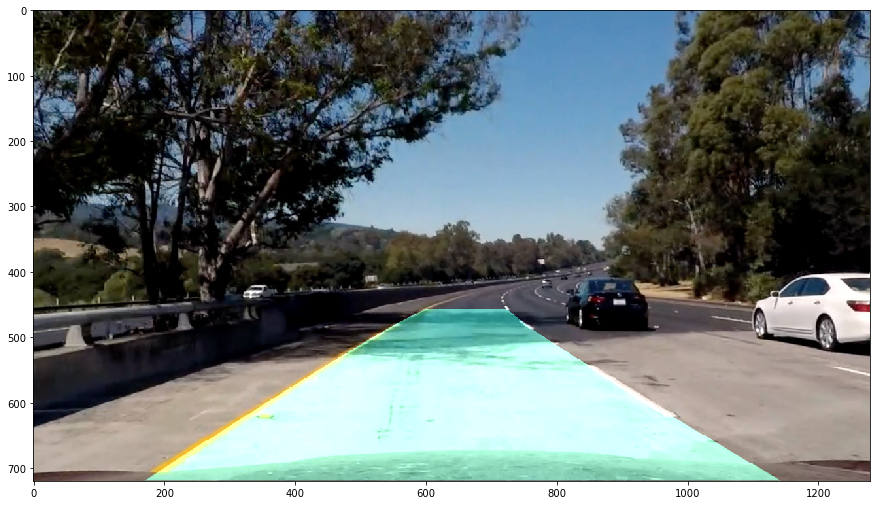

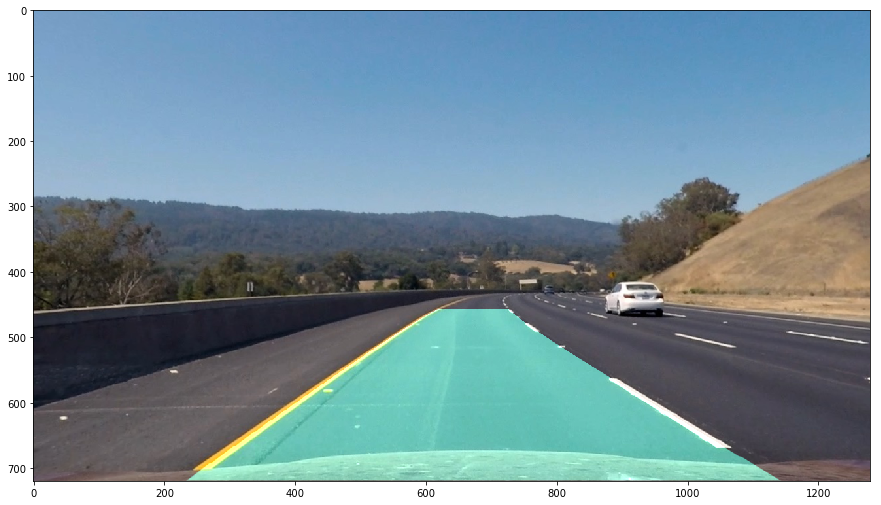

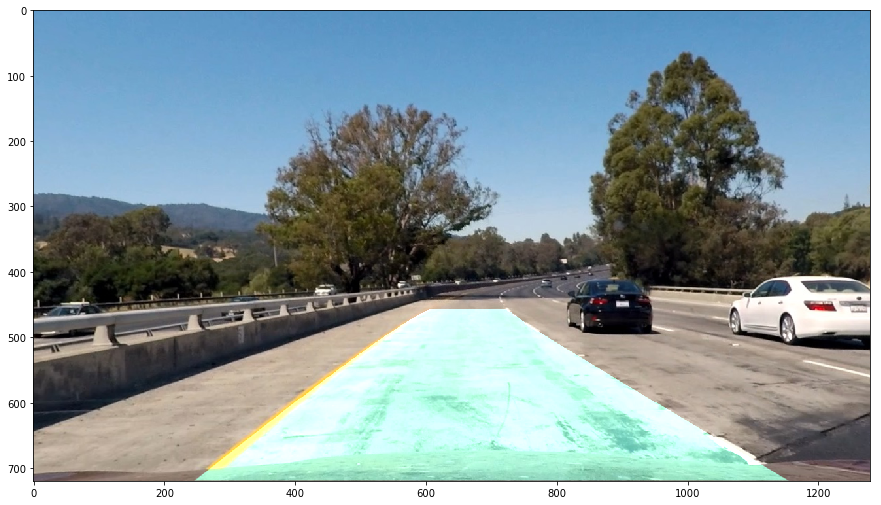

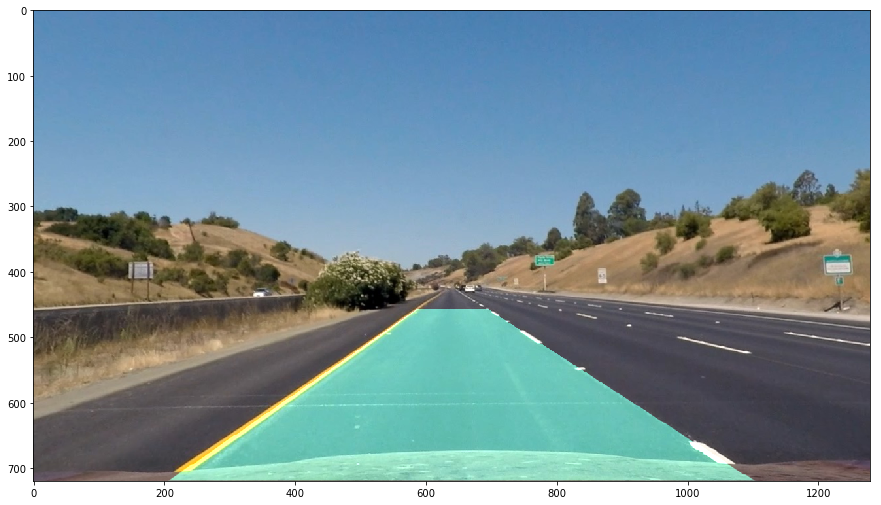

In [30]:
for result in results:
    plt.figure(figsize=(15,20))
    plt.imshow(bgr2rgb(result['output_imgs'][4]))
    plt.show()
    plt.close()

/home/server/anaconda3/envs/keras-gpu/lib/python3.6/site-packages/ipykernel_launcher.py:6: FutureWarning: comparison to `None` will result in an elementwise object comparison in the future.
  


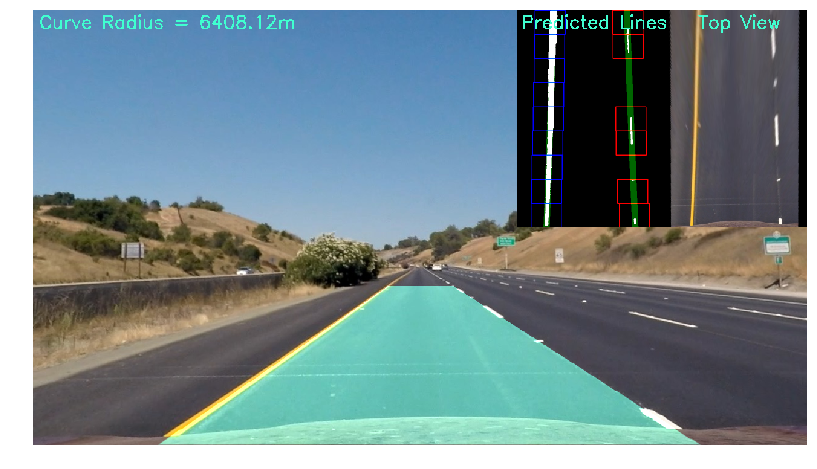

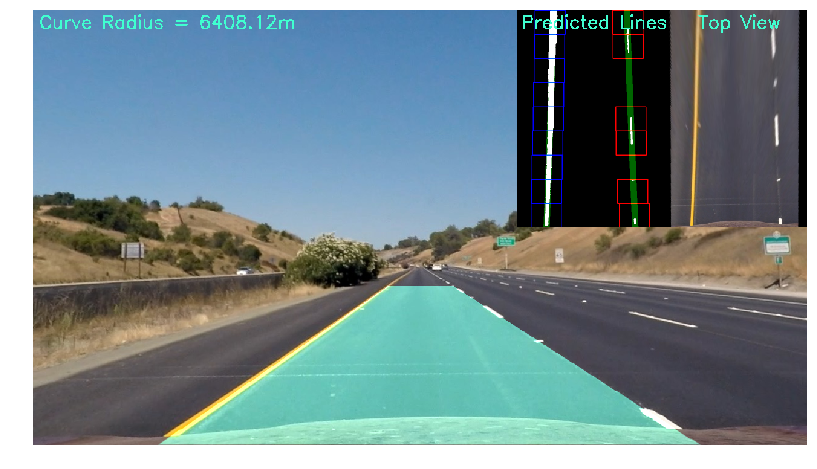

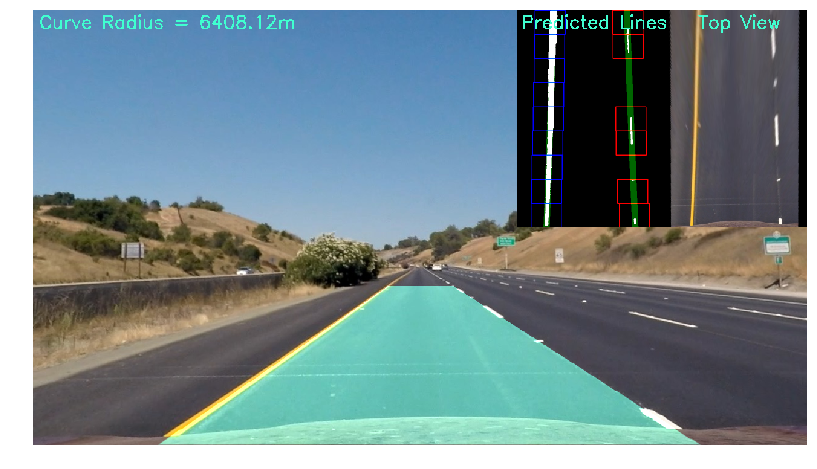

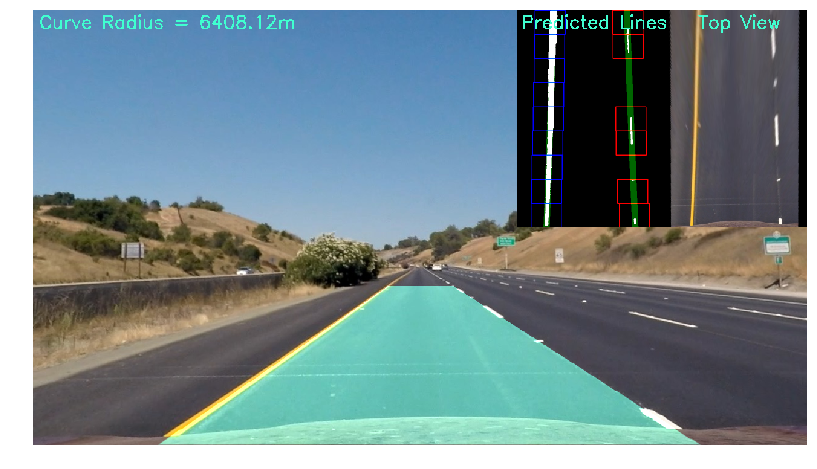

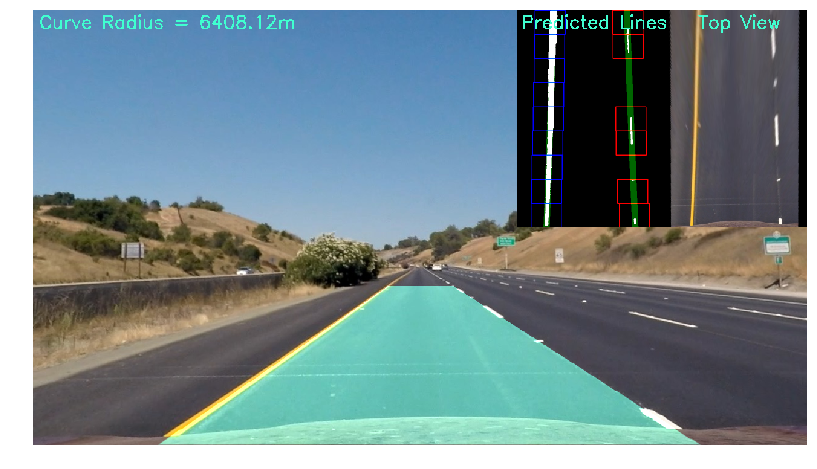

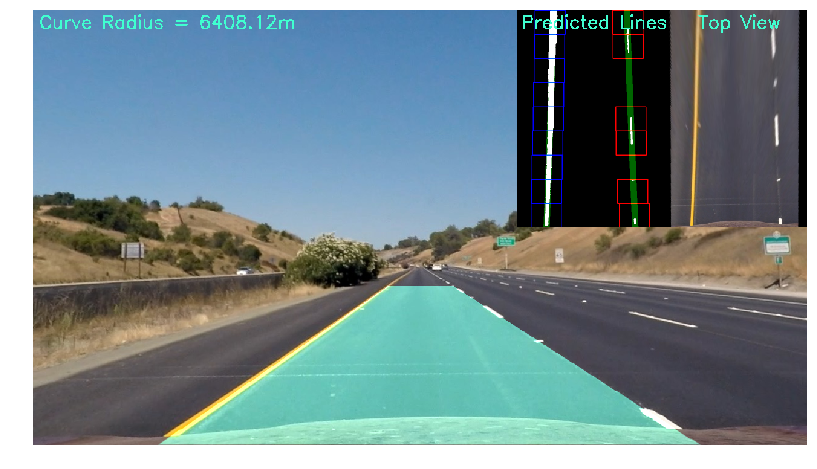

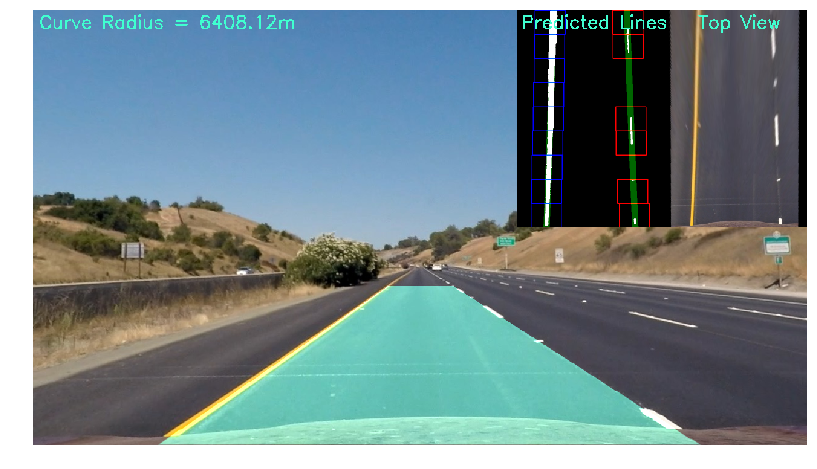

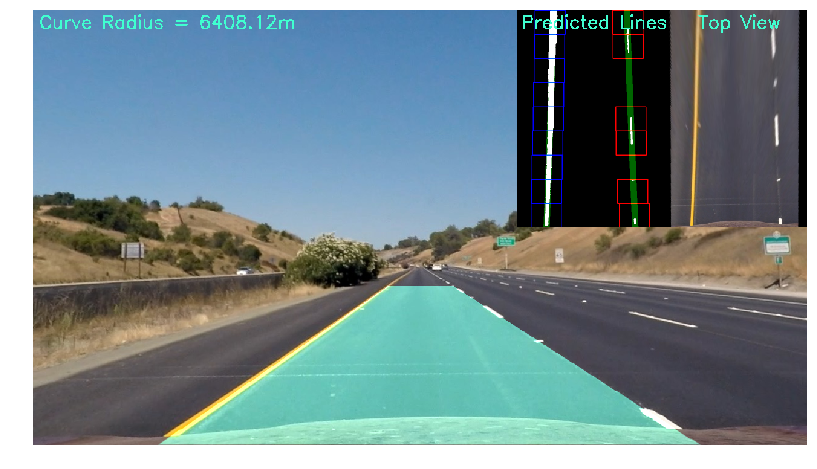

In [32]:
# the results with combined images
for path in test_images:
    raw = cv2.imread(path)
    out_imgs, measurements = lane_detector(raw, c_mtx=c_mtx, dist=dist)
    combined_img = combine_output(out_imgs, measurements)
    plt.figure(figsize=(24,8))
    plt.imshow(combined_img)
    plt.axis('off')
    plt.show()
    plt.close()

### Detection on Video Stream

In [35]:
from moviepy.editor import VideoFileClip
from IPython.display import HTML

In [36]:
def process_image(image):
    image = cv2.cvtColor(image, cv2.COLOR_RGB2BGR)
    out_imgs, measurements = lane_detector(image, c_mtx=c_mtx, dist=dist, std_max=15., min_samp=30)
    combined_img = combine_output(out_imgs, measurements)
    if combined_img is None:
        combined_img = bgr2rgb(out_imgs[4])
    return combined_img

In [37]:
output = 'output_project_video.mp4'

clip = VideoFileClip("project_video.mp4")
clip = clip.fl_image(process_image)
%time clip.write_videofile(output, audio=False)

[MoviePy] >>>> Building video output_project_video.mp4
[MoviePy] Writing video output_project_video.mp4


100%|█████████▉| 1260/1261 [05:32<00:00,  2.56it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: output_project_video.mp4 

CPU times: user 37min 37s, sys: 57.6 s, total: 38min 35s
Wall time: 5min 33s
